In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
from scipy import stats
from numpy.random import randn  
# 標準正規乱数はよく使うので，randn として importしておく

In [2]:
from PIL import Image
# pillowをインポートして画像を表示

# 19

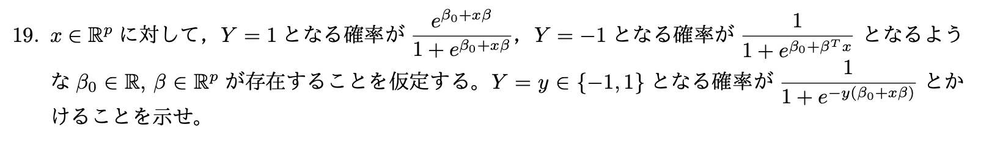

In [3]:
im = Image.open("question/q19.png")
im

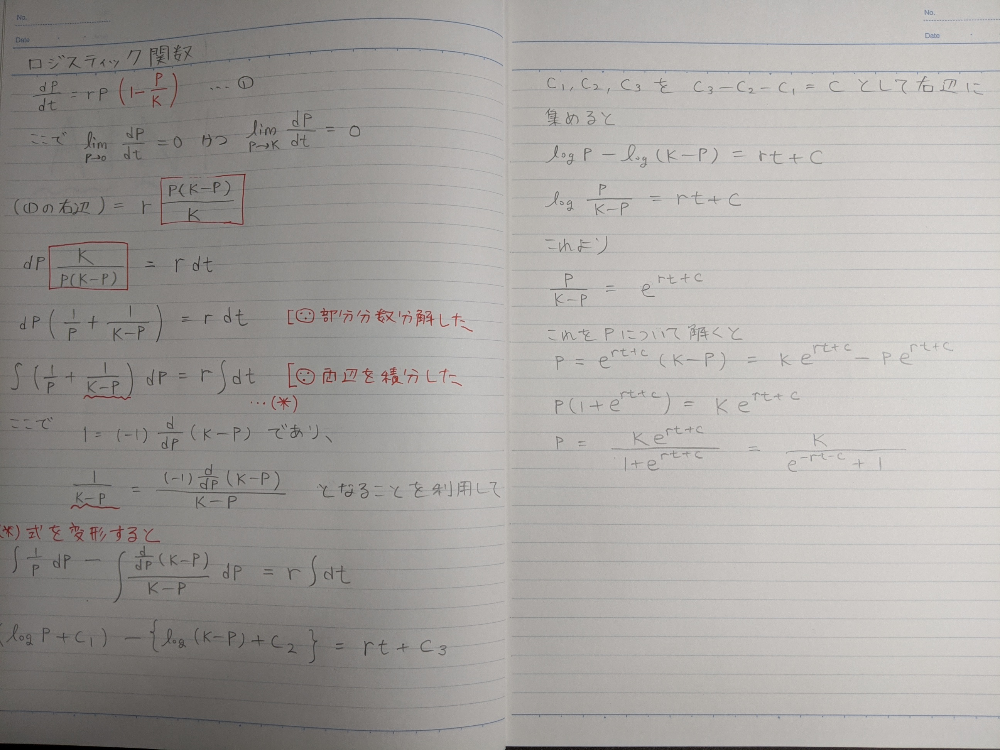

In [4]:
im = Image.open("answer/a19-logistic.jpg")
im

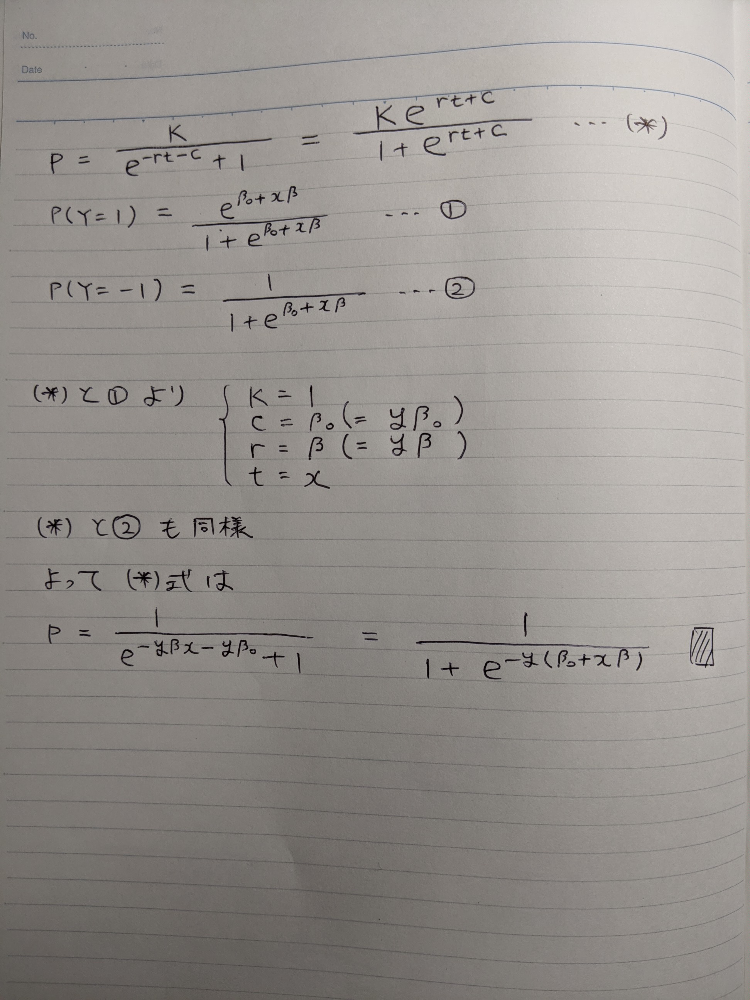

In [5]:
im = Image.open("answer/a19.jpg")
im

# 20

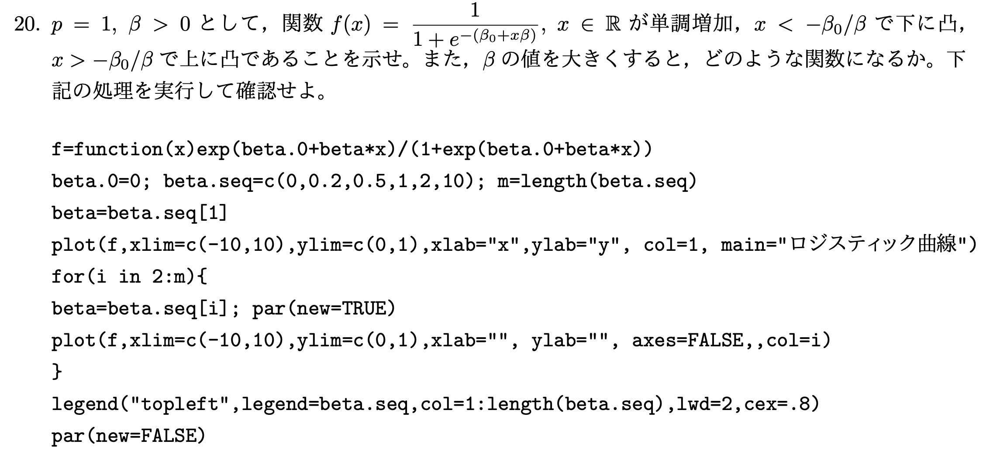

In [6]:
im = Image.open("question/q20.png")
im

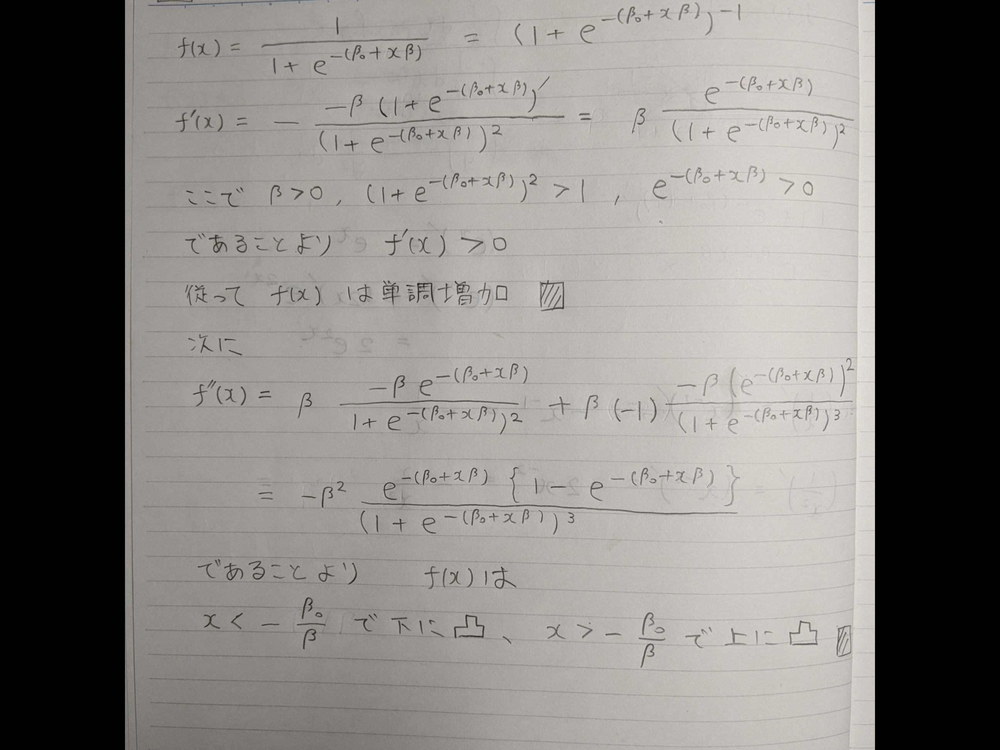

In [7]:
# 問題の前半部分：
im = Image.open("answer/a20.jpg")
im.rotate(-90)

In [8]:
# 問題の後半部分：
def f(x):
    return np.exp(beta_0+beta*x)/(1+np.exp(beta_0+beta*x))

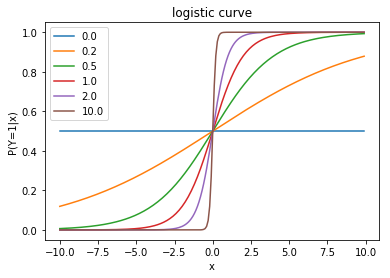

In [9]:
beta_0=0
beta_seq=np.array([0,0.2,0.5,1,2,10])
x_seq=np.arange(-10,10,0.1)

plt.xlabel("x")
plt.ylabel("P(Y=1|x)")
plt.title("logistic curve")
for i in range(beta_seq.shape[0]):
    beta=beta_seq[i]
    p=f(x_seq)
    plt.plot(x_seq,p,label='{}'.format(beta))
plt.legend(loc='upper left')

# 22

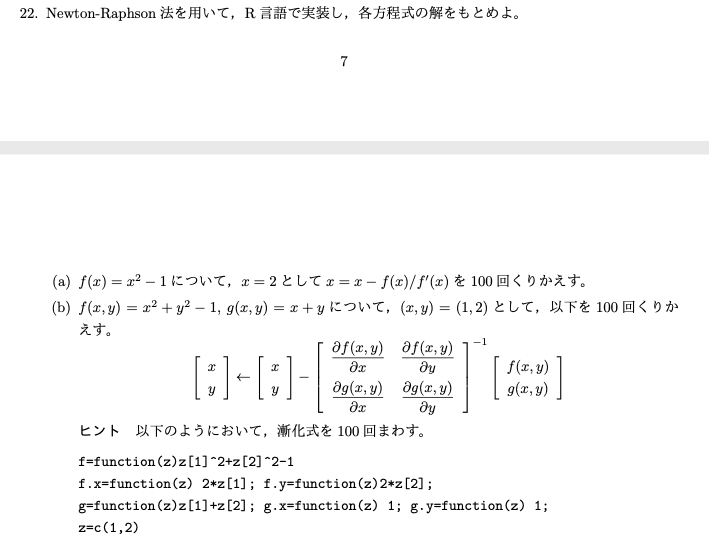

In [10]:
im = Image.open("question/q22.png")
im

In [11]:
# (a)

def f(x):
    return x**2 - 1

def df(x):
    return 2 * x

In [12]:
x = 2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

2

In [13]:
x = -2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

-1

初期値によって結果が変化する

In [14]:
#(b)

def f(z):
    return z[0]**2 + z[1]**2 - 1

def dfx(z):
    return 2 * z[0]

def dfy(z):
    return 2 * z[1]

def g(z):
    return z[0] + z[1]

def dgx(z):
    return 1

def dgy(z):
    return 1

In [15]:
# 初期値
z = np.array([1,2])

for i in range(100):
    jacob = np.array([[dfx(z), dfy(z)], [dgx(z), dgy(z)]])
    z = z - np.linalg.inv(jacob) @ np.array([f(z), g(z)])
z

SyntaxError: invalid syntax (<ipython-input-15-dcab8efb1cf8>, line 6)

In [ ]:
f(z)

In [ ]:
g(z)

f(x,y)とg(x,y)のどちらも0と見なしてよい。

# 24

In [ ]:
N=1000; p=2
X=randn(N,p) 
X

In [ ]:
X=np.insert(X, 0, 1, axis=1)
X

In [ ]:
beta=randn(p+1)
beta

In [ ]:
y=[]
prob=1/(1+np.exp(X@beta))
prob

In [ ]:
for i in range(N):
    if (np.random.rand(1)>prob[i]):
        y.append(1)
    else :
        y.append(-1)
#データの生成ここまで
beta #確認

In [ ]:
#最尤推定
beta=np.inf
gamma=randn(p+1) #betaの初期値
print(gamma)
while (np.sum((beta-gamma)**2)>0.001):
    beta=gamma
    s = X@beta
    v = np.exp(-s*y)
    u = (y*v)/(1+v)  # (N,)
    w = v/(1+v)**2  # (N,)
    W = np.diag(w)  # (N,N)
    z = s+u/w
    
    gamma=np.linalg.inv(X.T@W@X)@X.T@W@z
    print (gamma)

gammaはほぼbetaと同じ値に収束していることが確認できた